In [1]:
import pandas as pd
import numpy as np

from pathlib import Path
import os
import h5py

import matplotlib.pyplot as plt

import cv2

from src.image_pairs_matcher import ImagePairsMatcher
from src.styles import set_styles, TXT_ACC, TXT_RESET

SEED=42

import warnings
warnings.filterwarnings('ignore')

set_styles()


In [2]:
class CFG:
    dir_train = 'data\\train'
    path_target = 'data\\train\\train_labels.csv'

In [3]:
def display_image_pair(index_pair, image_paths):
    idx1, idx2, dst = index_pair
    img1 = plt.imread(image_paths[idx1])
    img2 = plt.imread(image_paths[idx2])
    
    _, axes = plt.subplots(ncols=2, nrows=2, figsize=(6,4))
    axes[0, 0].imshow(img1)    
    axes[0, 1].imshow(img2)
    
    plt.suptitle(dst)
    
    plt.tight_layout()
    plt.show()

    
def multiline_path(path):
    image_name = path
    if len(image_name) > 15:
        substr = image_name.split('_')
        image_name = '\n'.join([f'{substr[i]}_{substr[i+1]}_{substr[i+2]}_' for i in range(0, len(substr)-2, 3)])
        image_name += '\n' + '_'.join(substr[-2:])
    return image_name
    
    
def read_image_with_resize(path, max_dim):
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ratio = max_dim / max(img.shape[0], img.shape[1])
    img = cv2.resize(img, None, fx=ratio, fy=ratio, interpolation=cv2.INTER_LINEAR)
    return img

def display_image_matches(index, image_paths, index_pairs):
    
    indice = [(p[0], p[2]) for p in index_pairs if p[1]==index]
    indice.extend([(p[1], p[2]) for p in index_pairs if p[0]==index])
    
    indice.sort(key=lambda x: x[1])
    indice = indice[:40]
    
    # main image
    img = read_image_with_resize(str(image_paths[index]), 300)

    _, ax = plt.subplots(ncols=1, nrows=1, figsize=(3,3))
    ax.imshow(img)
    img_name = str(image_paths[index]).split("\\")[-1]
    plt.suptitle(f'{img_name} [{index}]', fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    # other images
    
    ncols = 6
    nrows = int (np.ceil( len(indice) / ncols ))
    
    _, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(16,3*nrows))
    axes = axes.ravel()
    
    for (idx, dst), ax in zip(indice, axes):
        img = read_image_with_resize(str(image_paths[idx]), 200)

        ax.imshow(img)
        image_name = multiline_path(str(image_paths[idx]).split('\\')[-1])
        ax.set_title(f'{image_name} [{idx}]\n\n   {dst:.4f}', fontsize=8, fontweight='normal')
        ax.set_xticks([])
        ax.set_yticks([])
        
    for ax in axes[len(indice):]:
        ax.set_xticks([])
        ax.set_yticks([])
    
    plt.tight_layout()
    plt.show()


def display_dataset(dataset, index):
    print(f'{TXT_ACC} {dataset} {TXT_RESET}')
    dir_images = f'{CFG.dir_train}/{dataset}/images/'
    files = os.listdir(dir_images)
    image_names = [file for file in files if file.endswith('.png')]
    image_paths = [Path(os.path.join(dir_images, file)) for file in image_names]
    dir_features = f'{CFG.dir_train}/{dataset}/features/'

    with h5py.File(dir_features + 'embeddings_dinov2_base.h5', mode='r') as f_embeddings:
        embeddings = [f_embeddings[key][:] for key in f_embeddings.keys()]

    pair_matcher = ImagePairsMatcher()
    index_pairs = pair_matcher.run(embeddings)

    display_image_matches(index, image_paths, index_pairs)

 transp_obj_glass_cup 


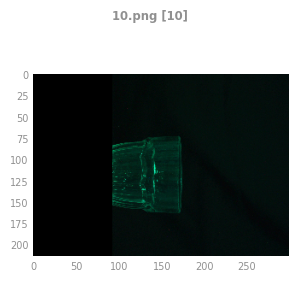

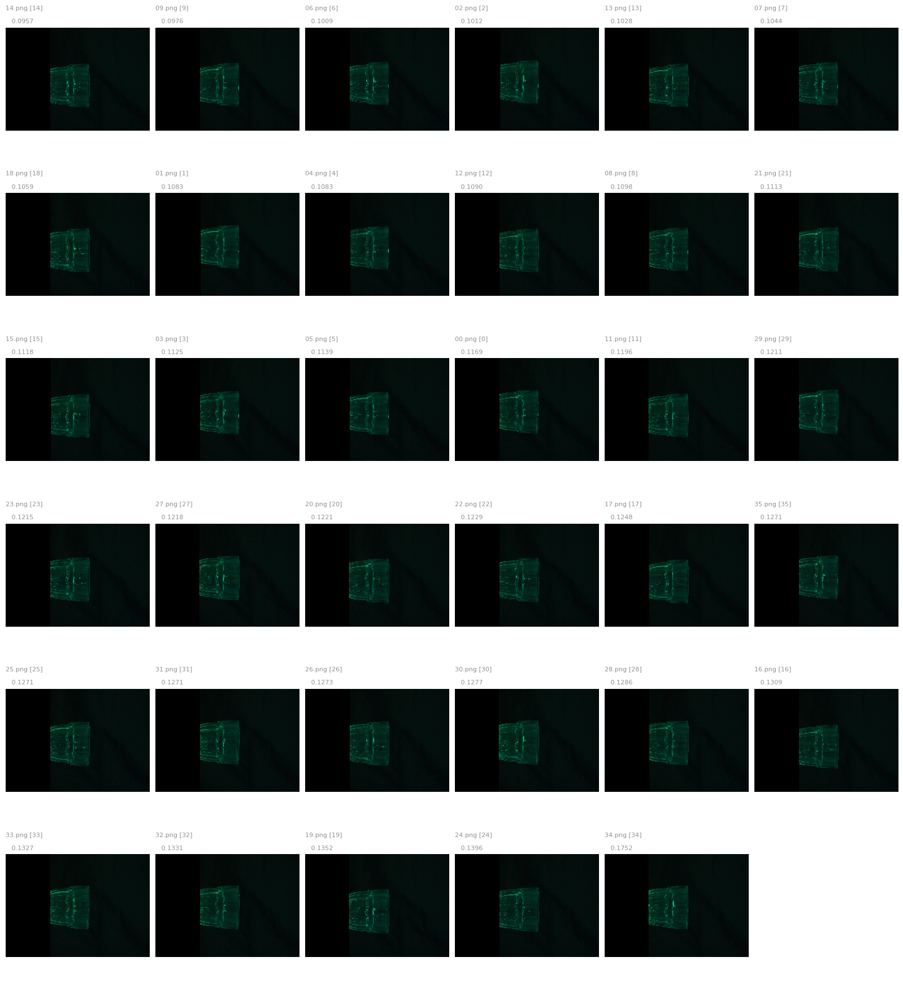

 transp_obj_glass_cylinder 


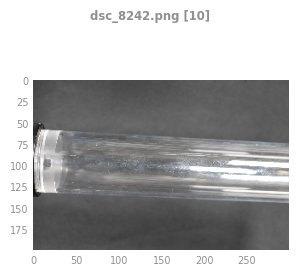

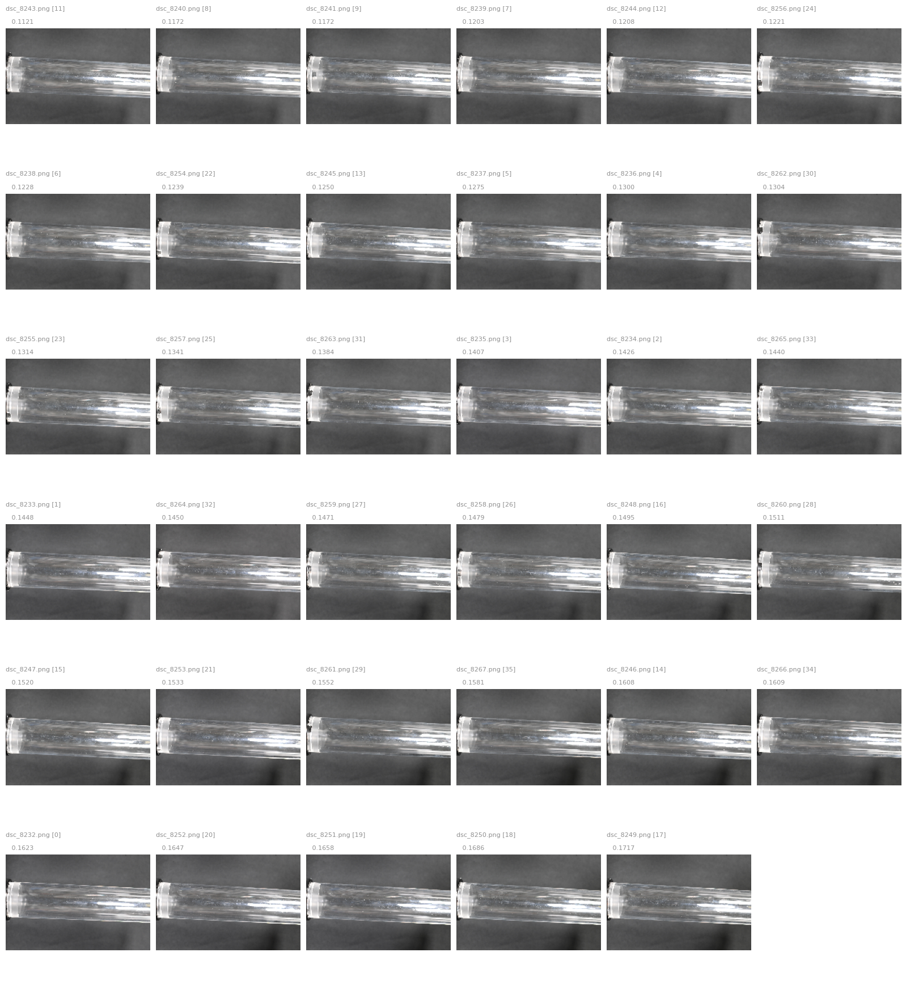

 multi-temporal-temple-baalshamin 


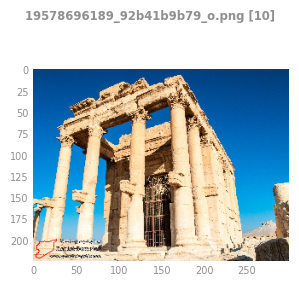

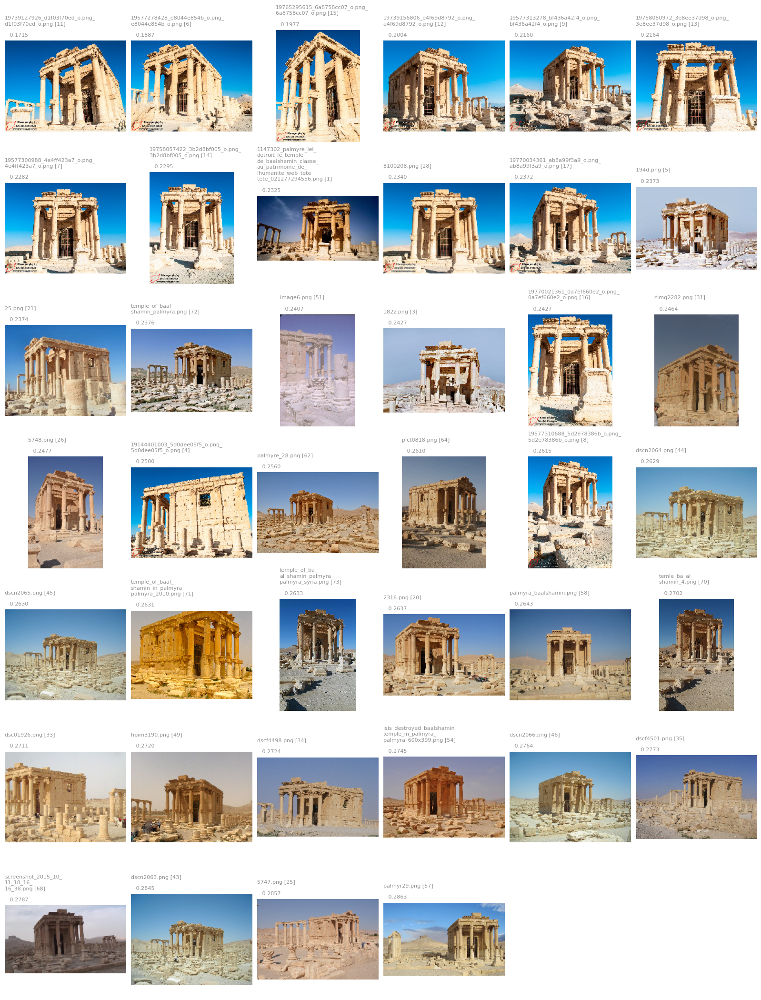

 church 


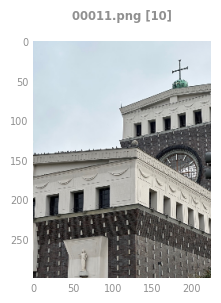

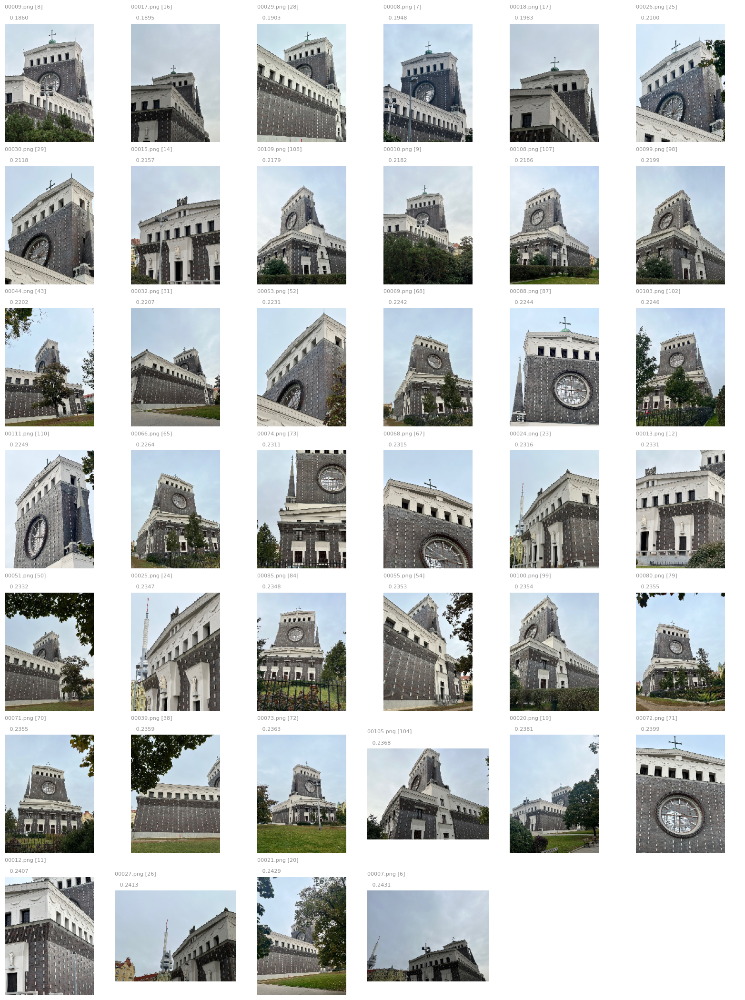

 dioscuri 


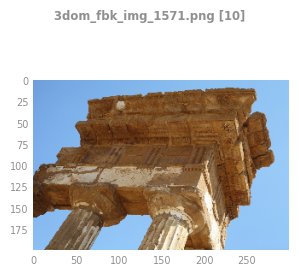

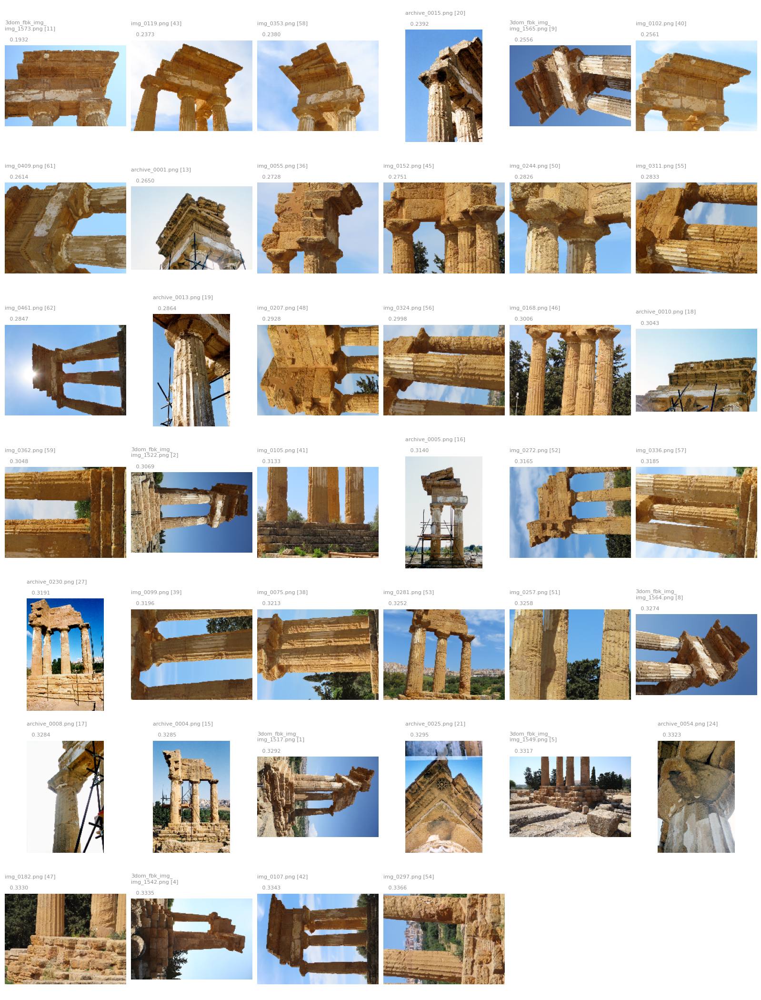

In [4]:
datasets = ['transp_obj_glass_cup', 'transp_obj_glass_cylinder', 'multi-temporal-temple-baalshamin', 'church', 'dioscuri',
            # 'lizard', 'pond', 
            ]
for dataset in datasets:
    display_dataset(dataset, 10) # display at max 40 closest images